<p style="align: center;"><img src="https://static.tildacdn.com/tild6636-3531-4239-b465-376364646465/Deep_Learning_School.png" width="400"></p>

# Глубокое обучение. Часть 2
# Домашнее задание по теме "Механизм внимания"

Это домашнее задание проходит в формате peer-review. Это означает, что его будут проверять ваши однокурсники. Поэтому пишите разборчивый код, добавляйте комментарии и пишите выводы после проделанной работы.

В этом задании вы будете решать задачу классификации математических задач по темам (многоклассовая классификация) с помощью Transformer.

В качестве датасета возьмем датасет математических задач по разным темам. Нам необходим следующий файл:

[Файл с классами](https://docs.google.com/spreadsheets/d/1IMRxByfg7gjoZ5i7rxvuNDvSrbdOJOc-/edit?usp=drive_link&ouid=104379615679964018037&rtpof=true&sd=true)

**Hint:** не перезаписывайте модели, которые вы получите на каждом из этапов этого дз. Они ещё понадобятся.

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tqdm.auto import tqdm

import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

sns.set(palette='summer')

In [2]:
!pip install accelerate -U

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 297.6/297.6 kB 7.1 MB/s eta 0:00:00:00:01
  Attempting uninstall: accelerate
    Found existing installation: accelerate 0.28.0
    Uninstalling accelerate-0.28.0:
      Successfully uninstalled accelerate-0.28.0


In [3]:
!pip install datasets

In [4]:
!pip install transformers

In [5]:
!pip install evaluate

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.1/84.1 kB 4.4 MB/s eta 0:00:00


In [6]:
import transformers
from transformers import AutoTokenizer, AutoModel, Trainer, TrainingArguments, DataCollatorWithPadding
from datasets import load_dataset
import evaluate
from typing import Union
import copy

2024-04-26 14:38:18.373678: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-26 14:38:18.373798: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-26 14:38:18.507580: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [7]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

### Задание 1 (2 балла)

Напишите кастомный класс для модели трансформера для задачи классификации, использующей в качествке backbone какую-то из моделей huggingface.

Т.е. конструктор класса должен принимать на вход название модели и подгружать её из huggingface, а затем использовать в качестве backbone (достаточно возможности использовать в качестве backbone те модели, которые упомянуты в последующих пунктах)

In [8]:
### This is just an interface example. You may change it if you want.

class TransformerClassificationModel(nn.Module):
    def __init__(self, base_transformer_model: Union[str, nn.Module], num_classes: int):
        super(TransformerClassificationModel, self).__init__()
        self.backbone = AutoModel.from_pretrained(base_transformer_model)
        self.classifier = nn.Linear(self.backbone.config.hidden_size, num_classes)
        self.loss_fn = nn.CrossEntropyLoss()

    def forward(self, input_ids, token_type_ids, attention_mask, labels=None, output_attentions=False):
        # Return dict with logits
        outputs = self.backbone(
            input_ids, token_type_ids, attention_mask, output_attentions=output_attentions
        )
        pooled_output = outputs.pooler_output
        hidden_states = outputs.hidden_states
        attentions = outputs.attentions
        logits = self.classifier(pooled_output)
        
        loss = None
        
        if labels is not None:
            loss = self.loss_fn(logits, labels)

        return transformers.modeling_outputs.SequenceClassifierOutput(
            loss=loss,
            logits=logits,
            hidden_states=hidden_states,
            attentions=attentions
        )

### Задание 2 (1 балл)

Напишите функцию заморозки backbone у модели (если необходимо, возвращайте из функции модель)

In [9]:
def freeze_backbone_function(model: TransformerClassificationModel):
    for param in model.backbone.parameters():
        param.requires_grad = False
    return model

### Задание 3 (2 балла)

Напишите функцию, которая будет использована для тренировки (дообучения) трансформера (TransformerClassificationModel). Функция должна поддерживать обучение с замороженным и размороженным backbone.

In [10]:
def train_transformer(transformer_model, training_args, train_dataset, eval_dataset, 
                      tokenizer, data_collator, freeze_backbone=True):
    model = copy.deepcopy(transformer_model)
    model.to(device)
    
    if freeze_backbone:
        model = freeze_backbone_function(model)
    
    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_dataset,
        eval_dataset=eval_dataset,
        tokenizer=tokenizer,
        data_collator=data_collator, 
        compute_metrics=compute_metrics
    )
    
    trainer.train()

    return model

### Задание 4 (1 балл)

Проверьте вашу функцию из предыдущего пункта, дообучив двумя способами
*cointegrated/rubert-tiny2* из huggingface.

In [11]:
class MathDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_len=512):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer(
            text, return_tensors='pt', padding=True, truncation=True, max_length=self.max_len
        )
        return {
            'input_ids': encoding['input_ids'].squeeze().to(device),
            'token_type_ids': encoding['token_type_ids'].squeeze().to(device),
            'attention_mask': encoding['attention_mask'].squeeze().to(device),
            'label': torch.tensor(label, dtype=torch.long).to(device)
        }

In [12]:
from sklearn.metrics import accuracy_score, precision_recall_fscore_support

def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    
    accuracy = accuracy_score(labels, preds)
    precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average='weighted')
    
    return {
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1
    }

In [13]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

df_rus = pd.read_excel('/kaggle/input/math-problems/data_problems.xlsx')
texts_rus = df_rus['Задача'].values
labels_rus = LabelEncoder().fit_transform(df_rus['Тема'])

texts_train_rus, texts_eval_rus, labels_train_rus, labels_eval_rus = train_test_split(
    texts_rus, labels_rus, test_size=0.2, random_state=42
)

tokenizer_rus = AutoTokenizer.from_pretrained('cointegrated/rubert-tiny2')
data_collator_rus = DataCollatorWithPadding(tokenizer_rus)

train_dataset_rus = MathDataset(texts_train_rus, labels_train_rus, tokenizer_rus)
eval_dataset_rus = MathDataset(texts_eval_rus, labels_eval_rus, tokenizer_rus)

tokenizer_config.json:   0%|          | 0.00/401 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/1.08M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.74M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

In [14]:
N_CLASSES = len(set(labels_rus))
N_CLASSES

7

In [16]:
rubert_tiny_transformer_model = TransformerClassificationModel('cointegrated/rubert-tiny2', N_CLASSES)

training_args = TrainingArguments(
    evaluation_strategy='epoch',
    learning_rate=2e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=3,
    save_total_limit=3,
    output_dir='/kaggle/working/rubert/'
)

rubert_tiny_finetuned_with_freezed_backbone = train_transformer(
    transformer_model=rubert_tiny_transformer_model, 
    training_args=training_args, 
    train_dataset=train_dataset_rus, 
    eval_dataset=eval_dataset_rus, 
    tokenizer=tokenizer_rus, 
    data_collator=data_collator_rus, 
    freeze_backbone=True
)

/opt/conda/lib/python3.10/site-packages/accelerate/accelerator.py:436: FutureWarning: Passing the following arguments to `Accelerator` is deprecated and will be removed in version 1.0 of Accelerate: dict_keys(['dispatch_batches', 'split_batches', 'even_batches', 'use_seedable_sampler']). Please pass an `accelerate.DataLoaderConfiguration` instead: 
dataloader_config = DataLoaderConfiguration(dispatch_batches=None, split_batches=False, even_batches=True, use_seedable_sampler=True)
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,1.874200,1.813279,0.442654,0.195943,0.442654,0.271642
2,1.776400,1.755486,0.442654,0.195943,0.442654,0.271642
3,1.739000,1.739195,0.442654,0.195943,0.442654,0.271642


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [17]:
rubert_tiny_finetuned = train_transformer(
    transformer_model=rubert_tiny_transformer_model, 
    training_args=training_args, 
    train_dataset=train_dataset_rus, 
    eval_dataset=eval_dataset_rus, 
    tokenizer=tokenizer_rus, 
    data_collator=data_collator_rus, 
    freeze_backbone=False
)

/opt/conda/lib/python3.10/site-packages/accelerate/accelerator.py:436: FutureWarning: Passing the following arguments to `Accelerator` is deprecated and will be removed in version 1.0 of Accelerate: dict_keys(['dispatch_batches', 'split_batches', 'even_batches', 'use_seedable_sampler']). Please pass an `accelerate.DataLoaderConfiguration` instead: 
dataloader_config = DataLoaderConfiguration(dispatch_batches=None, split_batches=False, even_batches=True, use_seedable_sampler=True)
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,1.524100,1.502321,0.478673,0.327440,0.478673,0.334463
2,1.437800,1.466236,0.491943,0.340556,0.491943,0.357518
3,1.423800,1.448329,0.488152,0.326756,0.488152,0.348124


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [18]:
training_args = TrainingArguments(
    evaluation_strategy='epoch',
    learning_rate=2e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=15,
    save_total_limit=3,
    output_dir='/kaggle/working/rubert/'
)

rubert_tiny_finetuned_15 = train_transformer(
    transformer_model=rubert_tiny_transformer_model, 
    training_args=training_args, 
    train_dataset=train_dataset_rus, 
    eval_dataset=eval_dataset_rus, 
    tokenizer=tokenizer_rus, 
    data_collator=data_collator_rus, 
    freeze_backbone=False
)

/opt/conda/lib/python3.10/site-packages/accelerate/accelerator.py:436: FutureWarning: Passing the following arguments to `Accelerator` is deprecated and will be removed in version 1.0 of Accelerate: dict_keys(['dispatch_batches', 'split_batches', 'even_batches', 'use_seedable_sampler']). Please pass an `accelerate.DataLoaderConfiguration` instead: 
dataloader_config = DataLoaderConfiguration(dispatch_batches=None, split_batches=False, even_batches=True, use_seedable_sampler=True)
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,1.520500,1.498829,0.478673,0.321484,0.478673,0.334790
2,1.434300,1.456190,0.489100,0.336069,0.489100,0.348584
3,1.417800,1.435826,0.490047,0.319272,0.490047,0.343930
4,1.405100,1.414592,0.496682,0.348911,0.496682,0.357880
5,1.410700,1.423986,0.493839,0.335703,0.493839,0.347127
6,1.376400,1.417725,0.492891,0.329786,0.492891,0.351369
7,1.392900,1.414914,0.490047,0.312428,0.490047,0.343624
8,1.399200,1.427515,0.488152,0.307155,0.488152,0.341808
9,1.383600,1.419289,0.487204,0.329726,0.487204,0.349120
10,1.408500,1.426674,0.483412,0.320187,0.483412,0.339497


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classif

* Rubert переобучается на большем кол-ве эпох. Оптимальное число эпох для файнтюнинга - 6.

### Задание 5 (1 балл)

Обучите *tbs17/MathBert* (с замороженным backbone и без заморозки), проанализируйте результаты. Сравните скоры с первым заданием. Получилось лучше или нет? Почему?

In [19]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

df_eng = pd.read_excel('/kaggle/input/math-problems/data_problems_translated.xlsx').dropna()
texts_eng = df_eng['problem_text'].values
labels_eng = LabelEncoder().fit_transform(df_eng['topic'])

texts_train_eng, texts_eval_eng, labels_train_eng, labels_eval_eng = train_test_split(
    texts_eng, labels_eng, test_size=0.2, random_state=0
)

tokenizer_eng = AutoTokenizer.from_pretrained('tbs17/MathBert')
data_collator_eng = DataCollatorWithPadding(tokenizer_eng)

train_dataset_eng = MathDataset(texts_train_eng, labels_train_eng, tokenizer_eng)
eval_dataset_eng = MathDataset(texts_eval_eng, labels_eval_eng, tokenizer_eng)

tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/569 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

In [20]:
N_CLASSES = len(set(labels_eng))
N_CLASSES

7

In [21]:
mathbert_transformer_model = TransformerClassificationModel('tbs17/MathBert', N_CLASSES)

training_args = TrainingArguments(
    evaluation_strategy='epoch',
    learning_rate=2e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=3,
    save_total_limit=3,
    output_dir='/kaggle/working/mathbert/'
)

mathbert_finetuned_with_freezed_backbone = train_transformer(
    transformer_model=mathbert_transformer_model, 
    training_args=training_args, 
    train_dataset=train_dataset_eng, 
    eval_dataset=eval_dataset_eng, 
    tokenizer=tokenizer_eng, 
    data_collator=data_collator_eng, 
    freeze_backbone=True
)

pytorch_model.bin:   0%|          | 0.00/441M [00:00<?, ?B/s]

/opt/conda/lib/python3.10/site-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()
/opt/conda/lib/python3.10/site-packages/accelerate/accelerator.py:436: FutureWarning: Passing the following arguments to `Accelerator` is deprecated and will be removed in version 1.0 of Accelerate: dict_keys(['dispatch_batches', 'split_batches', 'even_batches', 'use_seedable_sampler']). Please pass an `accelerate.DataLoaderConfiguration` instead: 
dataloader_config = DataLoaderConfiguration(dispatch_batches=None, split_batches=False, even_batches=True, use_seedable_sampler=True)
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,1.684900,1.603775,0.454459,0.206533,0.454459,0.284000
2,1.588500,1.596735,0.454459,0.206533,0.454459,0.284000
3,1.586200,1.594396,0.454459,0.206533,0.454459,0.284000


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [22]:
mathbert_finetuned = train_transformer(
    transformer_model=mathbert_transformer_model, 
    training_args=training_args, 
    train_dataset=train_dataset_eng, 
    eval_dataset=eval_dataset_eng, 
    tokenizer=tokenizer_eng, 
    data_collator=data_collator_eng, 
    freeze_backbone=False
)

/opt/conda/lib/python3.10/site-packages/accelerate/accelerator.py:436: FutureWarning: Passing the following arguments to `Accelerator` is deprecated and will be removed in version 1.0 of Accelerate: dict_keys(['dispatch_batches', 'split_batches', 'even_batches', 'use_seedable_sampler']). Please pass an `accelerate.DataLoaderConfiguration` instead: 
dataloader_config = DataLoaderConfiguration(dispatch_batches=None, split_batches=False, even_batches=True, use_seedable_sampler=True)
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,1.523800,1.456217,0.493359,0.268208,0.493359,0.343296
2,1.477500,1.468337,0.487666,0.265281,0.487666,0.337976
3,1.479700,1.481903,0.482922,0.261854,0.482922,0.333309


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [24]:
training_args = TrainingArguments(
    evaluation_strategy='epoch',
    learning_rate=2e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=10,
    save_total_limit=3,
    output_dir='/kaggle/working/mathbert/'
)

mathbert_finetuned_10 = train_transformer(
    transformer_model=mathbert_transformer_model, 
    training_args=training_args, 
    train_dataset=train_dataset_eng, 
    eval_dataset=eval_dataset_eng, 
    tokenizer=tokenizer_eng, 
    data_collator=data_collator_eng, 
    freeze_backbone=False
)

/opt/conda/lib/python3.10/site-packages/accelerate/accelerator.py:436: FutureWarning: Passing the following arguments to `Accelerator` is deprecated and will be removed in version 1.0 of Accelerate: dict_keys(['dispatch_batches', 'split_batches', 'even_batches', 'use_seedable_sampler']). Please pass an `accelerate.DataLoaderConfiguration` instead: 
dataloader_config = DataLoaderConfiguration(dispatch_batches=None, split_batches=False, even_batches=True, use_seedable_sampler=True)
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,1.554400,1.538580,0.476281,0.253061,0.476281,0.328373
2,1.520000,1.524785,0.472486,0.250306,0.472486,0.324398
3,1.526300,1.527765,0.473435,0.253687,0.473435,0.324032
4,1.542400,1.535868,0.472486,0.250430,0.472486,0.323326
5,1.500000,1.544862,0.468691,0.246739,0.468691,0.321177
6,1.552400,1.550439,0.466793,0.245544,0.466793,0.320134
7,1.519600,1.533054,0.471537,0.248880,0.471537,0.323210
8,1.548600,1.535576,0.471537,0.248985,0.471537,0.323184
9,1.539800,1.532643,0.472486,0.249816,0.472486,0.323748
10,1.523000,1.533224,0.472486,0.249568,0.472486,0.323790


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classif

* Mathbert в целом показал примерно такие же метрики. Так же, как и Rubert, переобучился на большем кол-ве эпох.

### Задание 6 (1 балл)

Напишите функцию для отрисовки карт внимания первого слоя для моделей из задания

In [25]:
import seaborn as sns

def get_attention_fig(text, tokens, attention, n_heads=12, n_rows=4, n_cols=3):
    assert n_rows * n_cols == n_heads

    fig = plt.figure(figsize=(12 * n_cols, 12 * n_rows))
    plt.title(text)
    for i in range(n_heads):
        ax = fig.add_subplot(n_rows, n_cols, i + 1)
        _attention = attention.squeeze(0)[i].cpu().detach().numpy()

        sns.heatmap(_attention, annot=False, cmap="viridis", ax=ax)

        ticks = [t.lower() for t in tokens]
        ax.set_xticklabels(ticks, rotation=45)
        ax.set_yticklabels(ticks, rotation=0)
    plt.plot()

### Задание 7 (1 балл)

Проведите инференс для всех моделей **ДО ДООБУЧЕНИЯ** на 2-3 текстах из датасета. Посмотрите на головы Attention первого слоя в каждой модели на выбранных текстах (отрисуйте их отдельно).

Попробуйте их проинтерпретировать. Какие связи улавливают карты внимания? (если в модели много голов Attention, то проинтерпретируйте наиболее интересные)

In [26]:
def get_first_layer_attentions(text, model, tokenizer):
    inputs = tokenizer(text, return_tensors='pt', padding=True, truncation=True).to(device)
    tokens = tokenizer.convert_ids_to_tokens(inputs['input_ids'].squeeze(0))
    
    model.to(device)
    with torch.no_grad():
        outputs = model.backbone(**inputs, output_attentions=True)
    
    attention_maps = outputs.attentions
    return tokens, attention_maps[0]

In [27]:
def plot_model_attention(texts, model, tokenizer):
    for text in texts:
        tokens, attention = get_first_layer_attentions(text, model, tokenizer)
        get_attention_fig(text, tokens, attention)

### Rubert

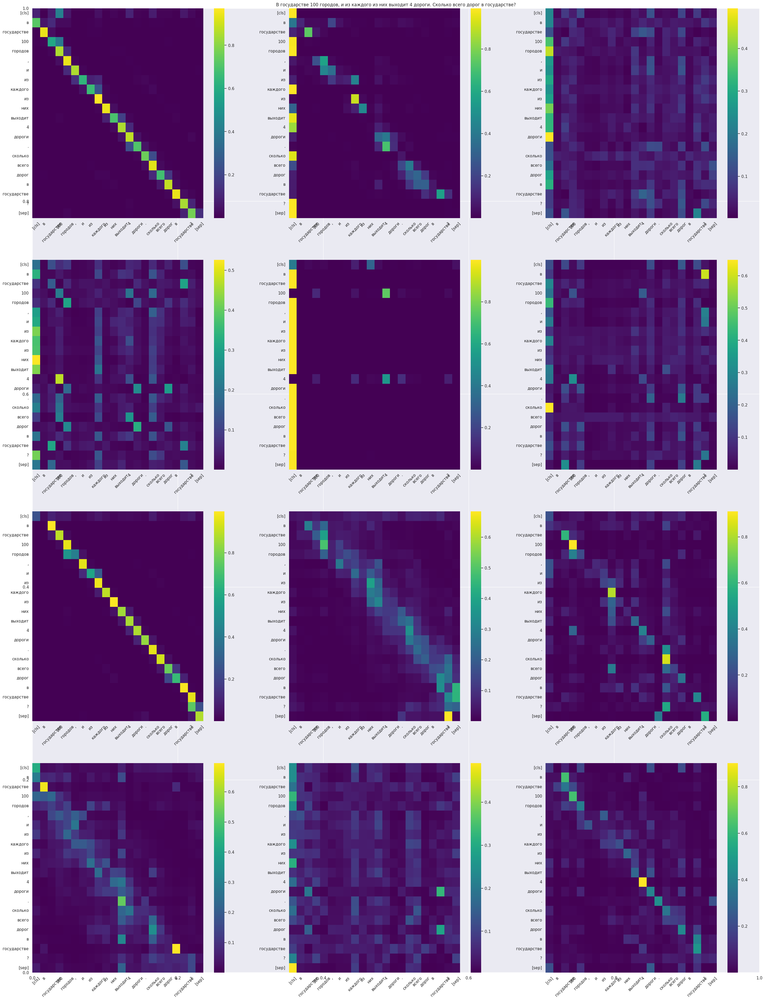

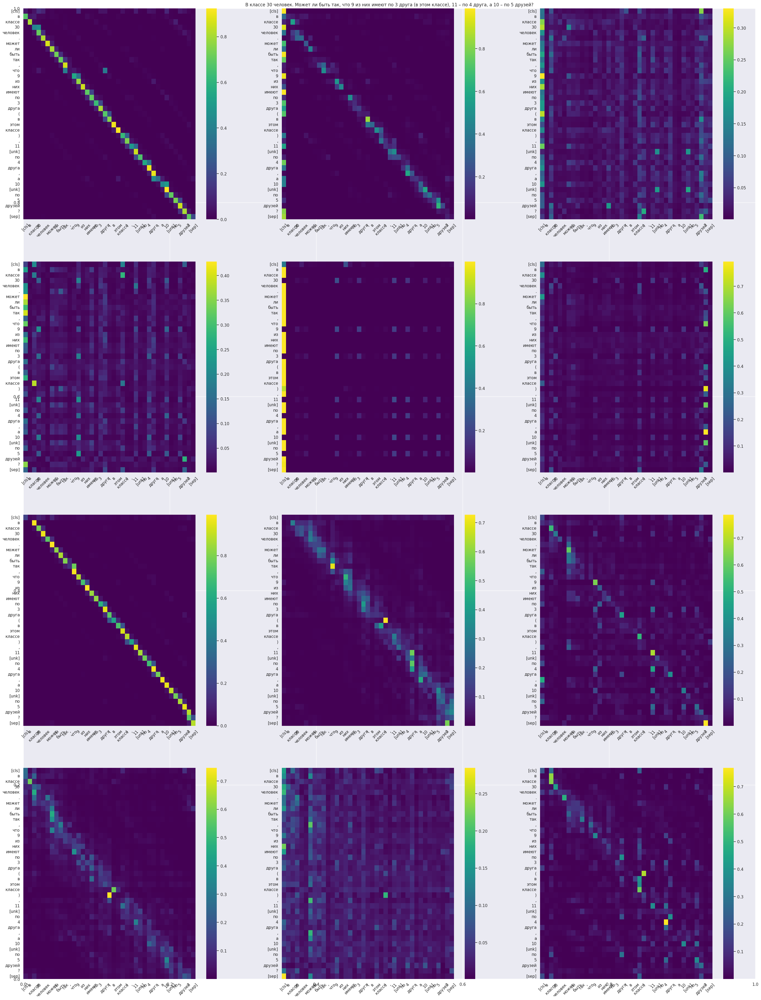

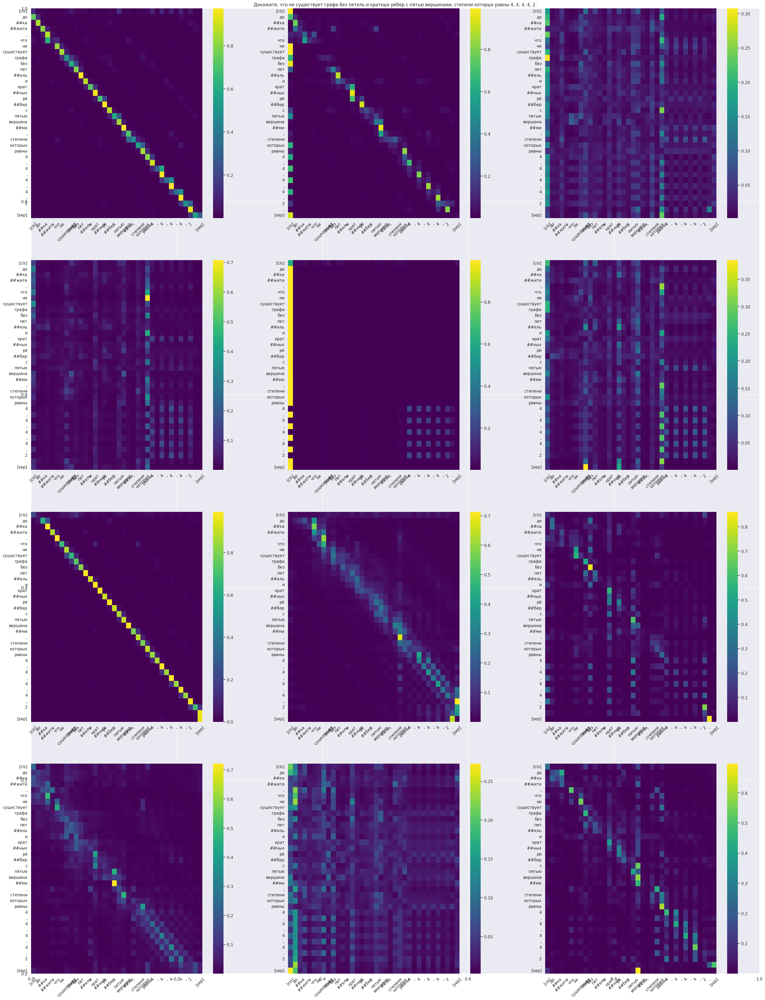

In [28]:
plot_model_attention(
    [texts_rus[2], texts_rus[3], texts_rus[7]], rubert_tiny_transformer_model, tokenizer_rus
)

### Mathbert

Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


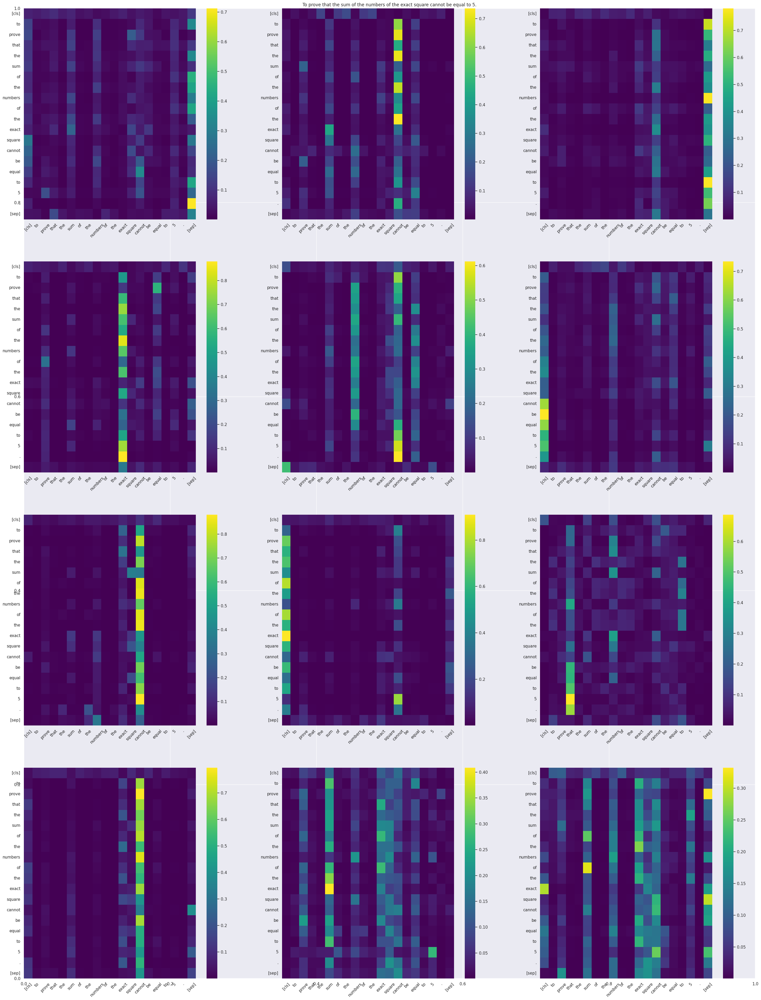

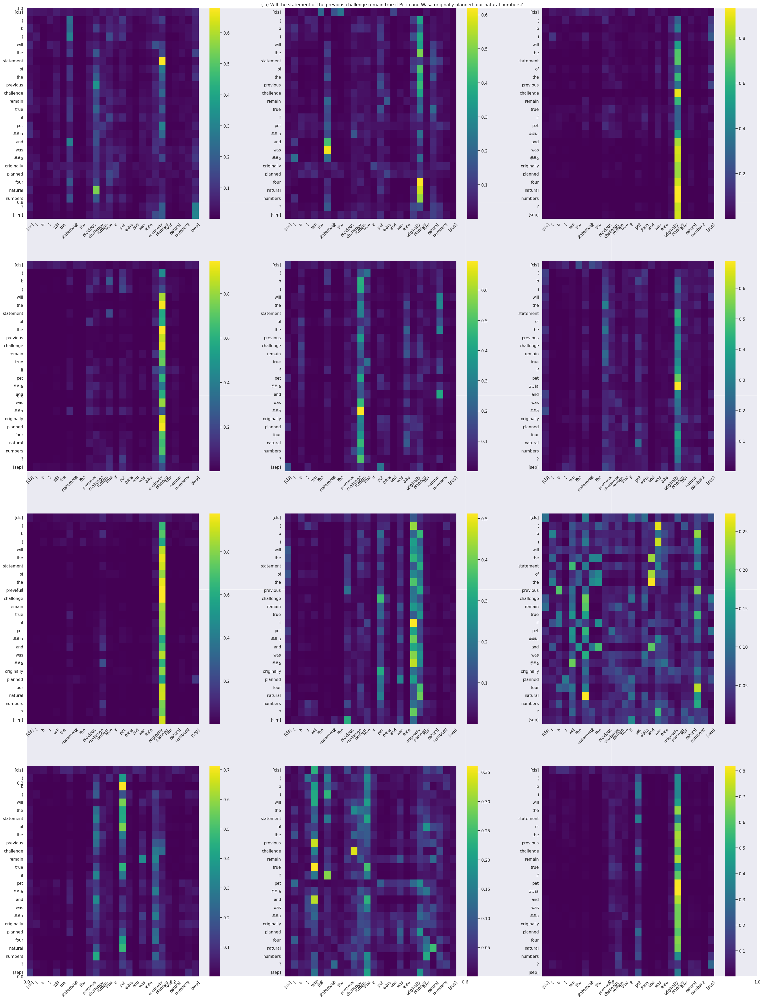

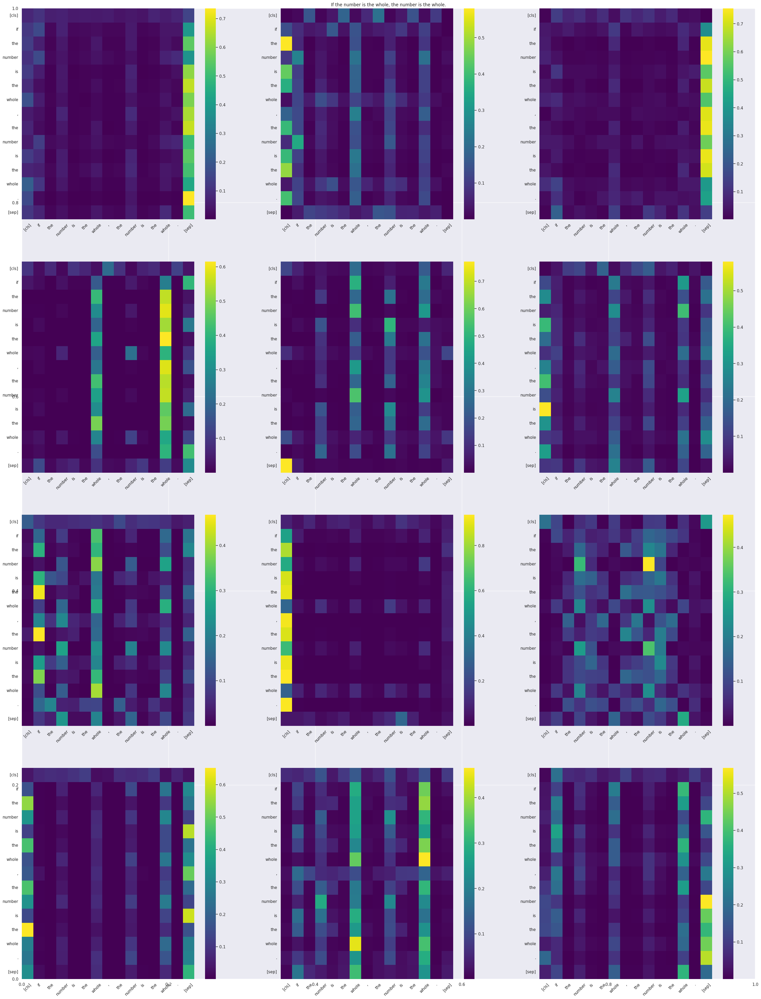

In [28]:
plot_model_attention(
    [texts_eng[0], texts_eng[1], texts_eng[5]], mathbert_transformer_model, tokenizer_eng
)

* Rubert чаще всего смотрит на токены спереди/сзади, иногда на первый токен. Mathbert же смотрит на какое-то конктретное слово.

### Задание 8 (1 балл)

Сделайте то же самое для дообученных моделей. Изменились ли карты внимания и связи, которые они улавливают? Почему?

### Finetuned Rubert

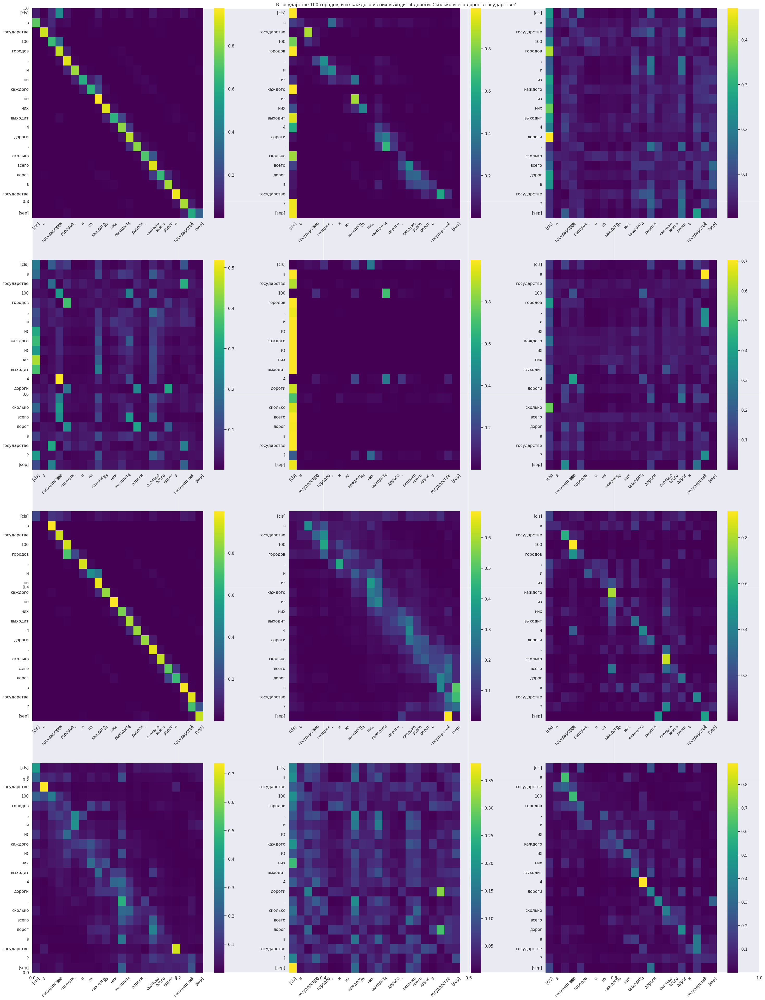

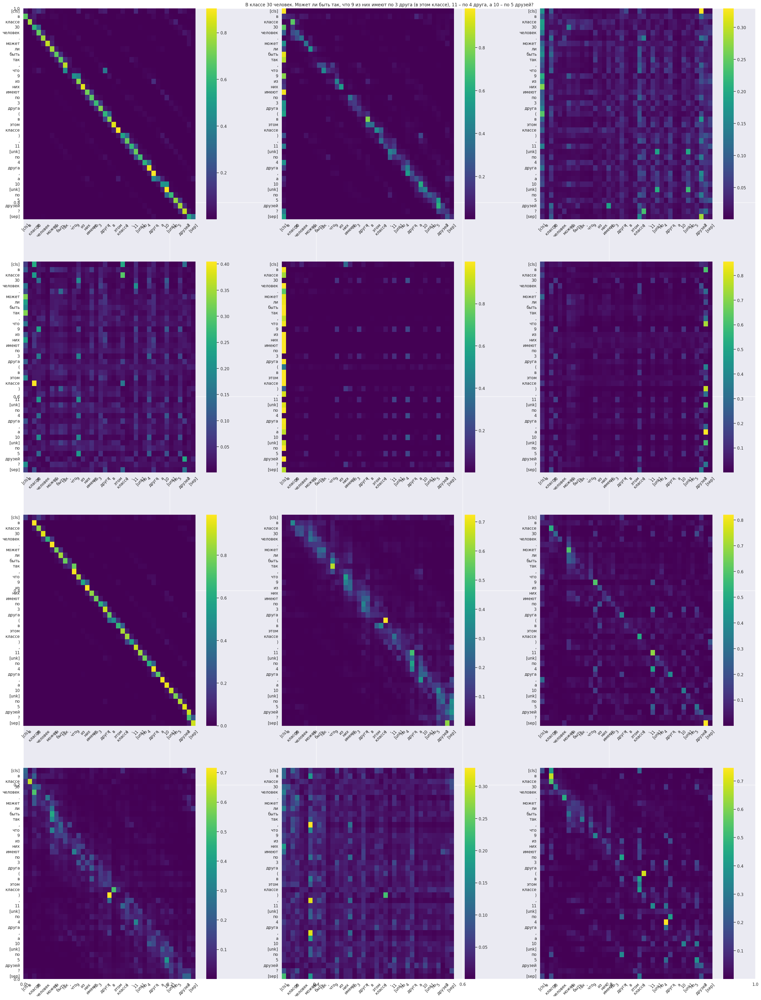

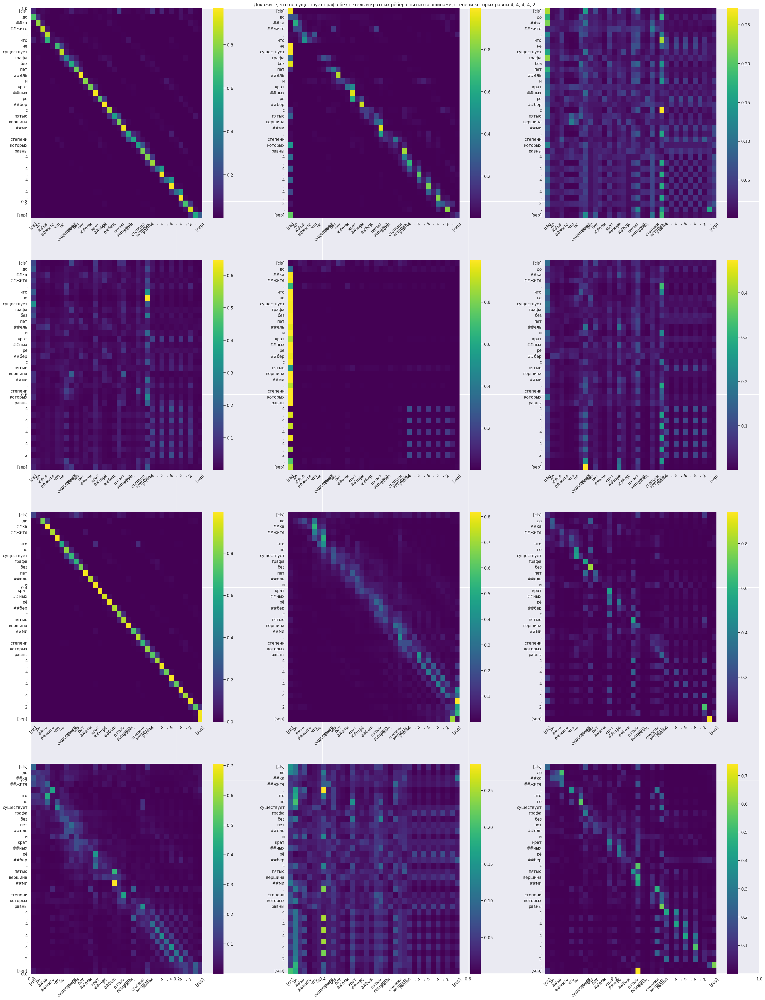

In [29]:
plot_model_attention(
    [texts_rus[2], texts_rus[3], texts_rus[7]], rubert_tiny_finetuned, tokenizer_rus
)

### Finetuned Mathbert

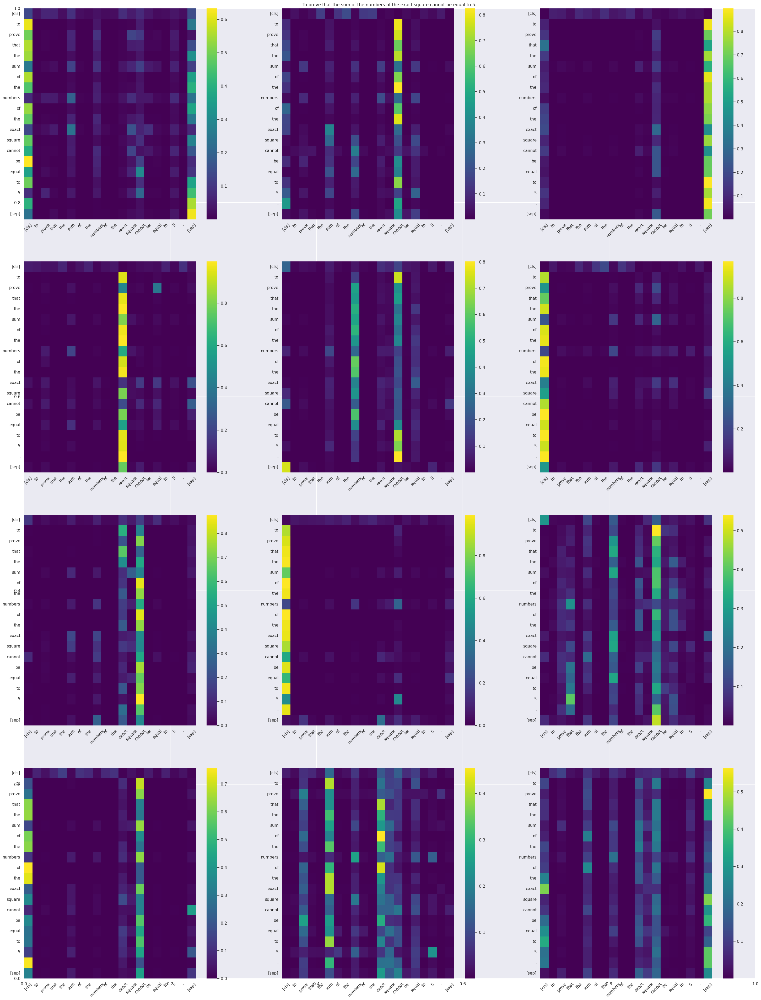

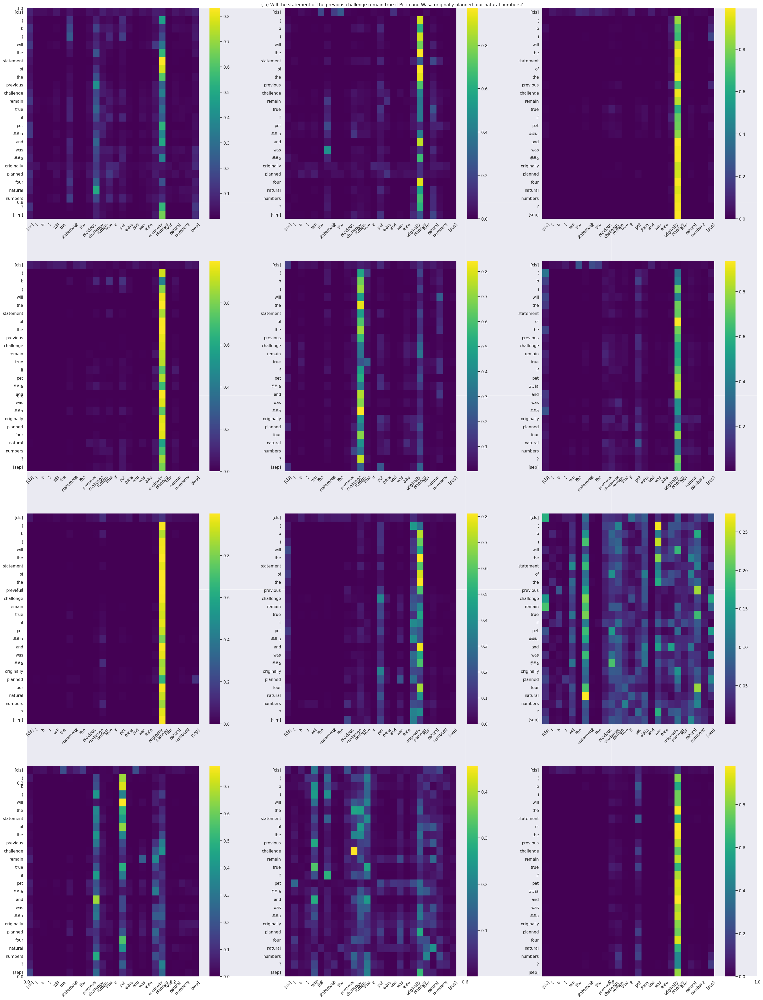

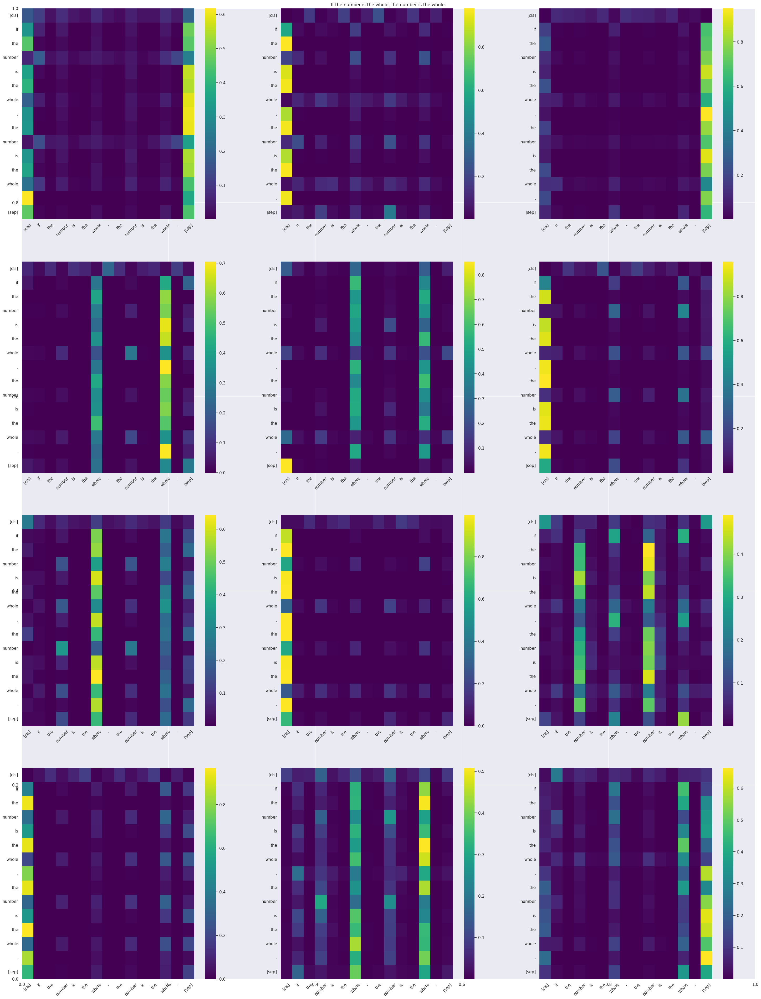

In [30]:
plot_model_attention(
    [texts_eng[0], texts_eng[1], texts_eng[5]], mathbert_finetuned, tokenizer_eng
)

In [31]:
def compare_attention_maps(text, tokens, attentions, n_heads=12):
    n_cols = len(attentions)
    n_rows = n_heads

    fig = plt.figure(figsize=(12 * n_cols, 12 * n_rows))
    plt.title(text)
    for i in range(n_rows):
        for j in range(n_cols):
            ax = fig.add_subplot(n_rows, n_cols, i * n_cols + j + 1)
            _attention = attentions[j].squeeze(0)[i].cpu().detach().numpy()

            sns.heatmap(_attention, annot=False, cmap="viridis", ax=ax)

            ticks = [t.lower() for t in tokens]
            ax.set_xticklabels(ticks, rotation=45)
            ax.set_yticklabels(ticks, rotation=0)
    plt.plot()

In [32]:
def plot_compare_attention_maps(texts, models, tokenizer):
    for text in texts:
        attentions = []
        for model in models:
            tokens, attention = get_first_layer_attentions(text, model, tokenizer)
            attentions.append(attention)
        compare_attention_maps(text, tokens, attentions)

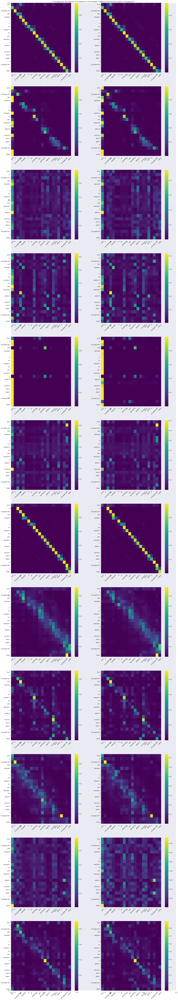

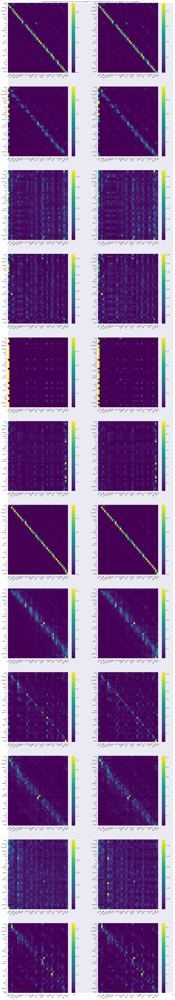

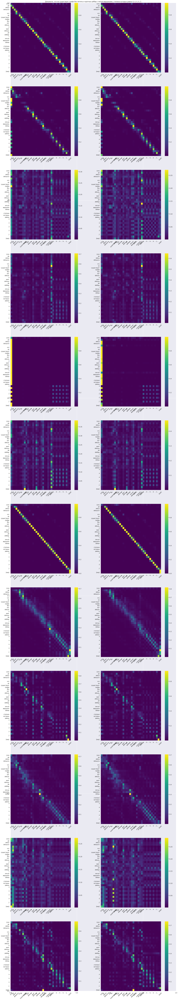

In [33]:
plot_compare_attention_maps(
    [texts_rus[2], texts_rus[3], texts_rus[7]], 
    [rubert_tiny_transformer_model, rubert_tiny_finetuned], 
    tokenizer_rus
)

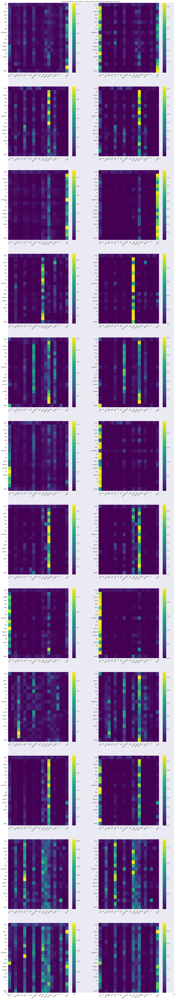

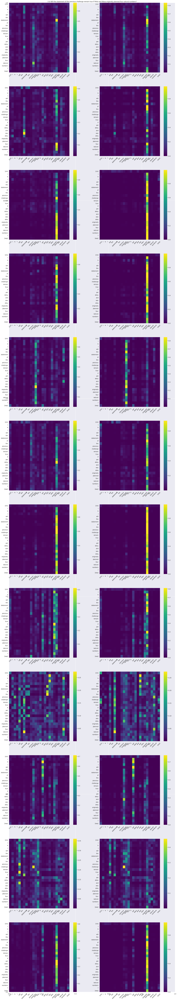

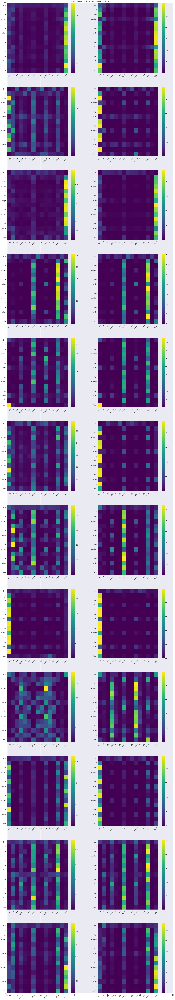

In [34]:
plot_compare_attention_maps(
    [texts_eng[0], texts_eng[1], texts_eng[5]], 
    [mathbert_transformer_model, mathbert_finetuned], 
    tokenizer_eng
)

* В целом, карты остались похожи для дообученных моделей, местами они стали более четкими.